### Background
Cardiovascular diseases kill approximately 17 million people globally every year, and they mainly exhibit as myocardial infarctions and heart failures. Heart failure (HF) occurs when the heart cannot pump enough blood to meet the needs of the body. Available electronic medical records of patients quantify symptoms, body features, and clinical laboratory test values, which can be used to perform biostatistics analysis aimed at highlighting patterns and correlations otherwise undetectable by medical doctors. Machine learning, in particular, can predict patient's survival from their data and can individuate the most important features among those included in their medical records.

In this paper, we analyze a dataset of 299 patients with heart failure collected in 2015. We apply several 2 decision tree classifiers to both predict the patients survival, based on their results we look to compare their performance for better insights. Additionaly we use cluster analysis for further insight to see what other information may be drawn from the data.

Attribute Information:

Thirteen (13) clinical features:

- age: age of the patient (years)
- anaemia: decrease of red blood cells or hemoglobin (boolean)
- high blood pressure: if the patient has hypertension (boolean)
- creatinine phosphokinase (CPK): level of the CPK enzyme in the blood (mcg/L)
- diabetes: if the patient has diabetes (boolean)
- ejection fraction: percentage of blood leaving the heart at each contraction (percentage)
- platelets: platelets in the blood (kiloplatelets/mL)
- sex: woman or man (binary)
- serum creatinine: level of serum creatinine in the blood (mg/dL)
- serum sodium: level of serum sodium in the blood (mEq/L)
- smoking: if the patient smokes or not (boolean)
- time: follow-up period (days)
- [target] death event: if the patient deceased during the follow-up period (boolean)



In [43]:

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 
import sklearn as skl
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,f1_score
from sklearn.model_selection import cross_val_score
from sklearn.decomposition import PCA

from sklearn import tree


In [44]:
df = pd.read_excel('heart_failure_clinical_records_dataset.xlsx')  

In [45]:
df.describe()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
count,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.00000,299.000000,299.000000,299.00000,299.000000,299.00000
mean,60.833893,0.431438,581.839465,0.418060,38.083612,0.351171,263358.029264,1.39388,136.625418,0.648829,0.32107,130.260870,0.32107
std,11.894809,0.496107,970.287881,0.494067,11.834841,0.478136,97804.236869,1.03451,4.412477,0.478136,0.46767,77.614208,0.46767
min,40.000000,0.000000,23.000000,0.000000,14.000000,0.000000,25100.000000,0.50000,113.000000,0.000000,0.00000,4.000000,0.00000
25%,51.000000,0.000000,116.500000,0.000000,30.000000,0.000000,212500.000000,0.90000,134.000000,0.000000,0.00000,73.000000,0.00000
50%,60.000000,0.000000,250.000000,0.000000,38.000000,0.000000,262000.000000,1.10000,137.000000,1.000000,0.00000,115.000000,0.00000
75%,70.000000,1.000000,582.000000,1.000000,45.000000,1.000000,303500.000000,1.40000,140.000000,1.000000,1.00000,203.000000,1.00000
max,95.000000,1.000000,7861.000000,1.000000,80.000000,1.000000,850000.000000,9.40000,148.000000,1.000000,1.00000,285.000000,1.00000


###  Initial visualization:

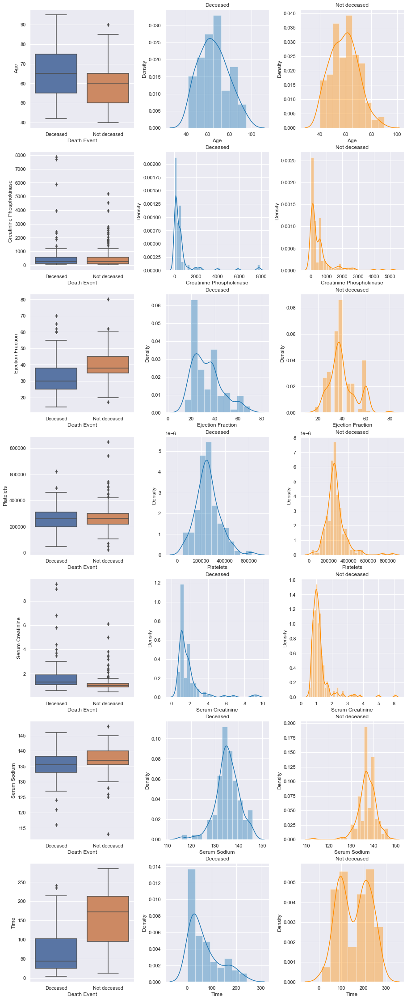

In [46]:
# visualized continues data
f,axes=plt.subplots(7,3,figsize=(15,40))
f.subplots_adjust(hspace=0.2)
f.subplots_adjust(wspace=0.3)
continues_features = ["age", "creatinine_phosphokinase","ejection_fraction", "platelets" ,"serum_creatinine","serum_sodium", "time"]
continues_titles = ["Age", "Creatinine Phosphokinase","Ejection Fraction", "Platelets" ,"Serum Creatinine","Serum Sodium", "Time"]
binary_features = ["anaemia","diabetes", "high_blood_pressure","sex","smoking"]
binary_titles = ["Anaemia","Diabetes", "High Blood Pressure","Sex","Smoking"]
y = ["DEATH_EVENT"]

df_temp = df.copy()
df_temp['DEATH_EVENT'] = df_temp['DEATH_EVENT'].apply(lambda x: "Deceased" if  x==1 else 'Not deceased')

df_deceased = df_temp[df_temp["DEATH_EVENT"]=="Deceased"].reset_index()
df_not_deceased = df_temp[df_temp["DEATH_EVENT"]=='Not deceased'].reset_index()
i=0
for f in continues_features:
    sns.boxplot(x=df_temp["DEATH_EVENT"], y=df_temp[f], data=df_temp, ax = axes[i,0])
    axes[i,0].set_xlabel('Death Event')
    axes[i,0].set_ylabel(continues_titles[i])

    sns.distplot(df_deceased[f], ax = axes[i,1],color="tab:blue")
    axes[i,1].set_xlabel(continues_titles[i])
    axes[i,1].set_ylabel('Density')
    axes[i, 1].set_title('Deceased')
    
    sns.distplot(df_not_deceased[f], ax = axes[i,2],color="darkorange"  )
    axes[i,2].set_xlabel(continues_titles[i])    
    axes[i,2].set_ylabel('Density')
    axes[i, 2].set_title('Not deceased')
    i+=1
    


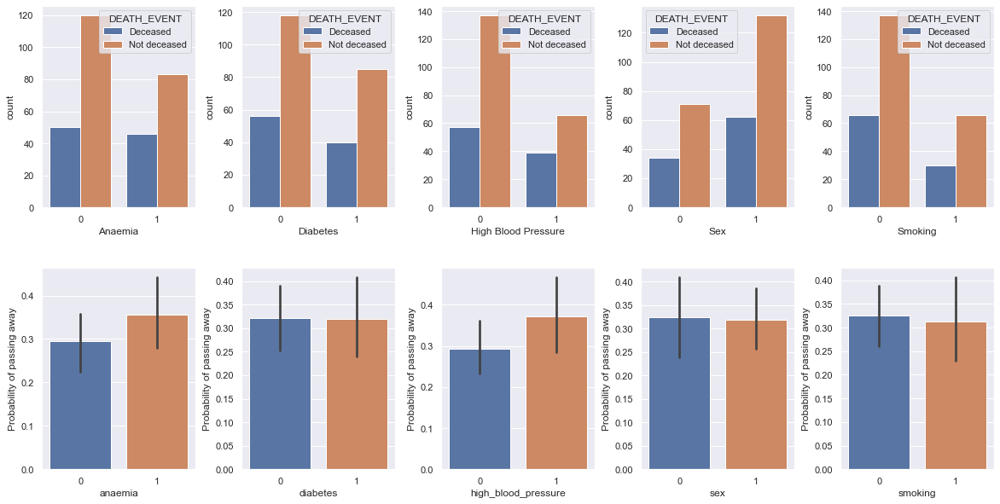

In [47]:
# visualized binary data
f,axes=plt.subplots(2,5,figsize=(20,10))
f.subplots_adjust(hspace=0.3)
f.subplots_adjust(wspace=0.3)

binary_features = ["anaemia","diabetes", "high_blood_pressure","sex","smoking"]
binary_titles = ["Anaemia","Diabetes", "High Blood Pressure","Sex","Smoking"]
y = ["DEATH_EVENT"]



i = 0
for f in binary_features:
    sns.countplot(x=f, hue="DEATH_EVENT", data=df_temp,ax =axes[0,i])
    axes[0,i].set_xlabel(binary_titles[i]) 
    sns.barplot(x=f, y="DEATH_EVENT", data=df,ax =axes[1,i])
    axes[1,i].set_ylabel("Probability of passing away")
    i+=1
    

### Data cleaning:

In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299 entries, 0 to 298
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       299 non-null    float64
 1   anaemia                   299 non-null    int64  
 2   creatinine_phosphokinase  299 non-null    int64  
 3   diabetes                  299 non-null    int64  
 4   ejection_fraction         299 non-null    int64  
 5   high_blood_pressure       299 non-null    int64  
 6   platelets                 299 non-null    float64
 7   serum_creatinine          299 non-null    float64
 8   serum_sodium              299 non-null    int64  
 9   sex                       299 non-null    int64  
 10  smoking                   299 non-null    int64  
 11  time                      299 non-null    int64  
 12  DEATH_EVENT               299 non-null    int64  
dtypes: float64(3), int64(10)
memory usage: 30.5 KB


* No null values
* age should be an int
* platelets should also be an int

After taking a deeper look into the data the float values in age come from 2 rows with the value 60.667 therfore I will round them to 61, and as for platelets we get 25 row with the a value of 263358.03 which is unusual because not only the rest of the platelet values are int but they exhibit 3 0 left of the decimal point meaning they have a 1000 interval.
In fact also the first value in platelets has an interval of less than 1000 therefore I will change that one as well.

In [49]:
# fix the values

df['age'] = df['age'].apply(lambda x:  round(x) if x==60.667 else x) 
df['platelets'] = df['platelets'].apply(lambda x: 263000   if x==263358.03 else x) 
df['platelets']= df['platelets'].apply(lambda x: round(x/1000)*1000   if isinstance(round(x/1000), int) else x) 



In [50]:
df.duplicated().where(lambda x : x!=False).dropna()

Series([], dtype: float64)

* No duplicates

####  Smoothing

Smooth the continues features with binning using equal-frequency histogram (5 bins).

In [51]:
df1 = df.copy()

In [52]:

#
df1 = df1.sort_values(by = ['age'])
df_arr =  np.array_split(df1,3)


In [53]:


# binning age: equal frequency
df1['bin_age']=0
df1 = df1.sort_values(by = ['age'])
df_arr =  np.array_split(df1,5)
for i in range(len(df_arr)):
    df_arr[i]['bin_age'] = i+1
df1 = pd.concat(df_arr)
    
# binning  creatininephosphokinase 
df1['bin_creatinine_phosphokinase']=0
df1 = df1.sort_values(by = ['creatinine_phosphokinase'])
df_arr =  np.array_split(df1,5)
for i in range(len(df_arr)):
    df_arr[i]['bin_creatinine_phosphokinase'] = i+1
df1 = pd.concat(df_arr)

# binning  creatininephosphokinase 
df1['bin_ejection_fraction']=0
df1 = df1.sort_values(by = ['ejection_fraction'])
df_arr =  np.array_split(df1,5)
for i in range(len(df_arr)):
    df_arr[i]['bin_ejection_fraction'] = i+1
df1 = pd.concat(df_arr)

# binning  platelets 
df1['bin_platelets']=0
df1 = df1.sort_values(by = ['platelets'])
df_arr =  np.array_split(df1,5)
for i in range(len(df_arr)):
    df_arr[i]['bin_platelets'] = i+1
df1 = pd.concat(df_arr)

# binning  serum creatinine 
df1['bin_serum_creatinine']=0
df1 = df1.sort_values(by = ['serum_creatinine'])
df_arr =  np.array_split(df1,5)
for i in range(len(df_arr)):
    df_arr[i]['bin_serum_creatinine'] = i+1
df1 = pd.concat(df_arr)

# binning  serum creatinine 
df1['bin_serum_creatinine']=0
df1 = df1.sort_values(by = ['serum_creatinine'])
df_arr =  np.array_split(df1,5)
for i in range(len(df_arr)):
    df_arr[i]['bin_serum_creatinine'] = i+1
df1 = pd.concat(df_arr)

# binning  serum creatinine 
df1['bin_serum_sodium']=0
df1 = df1.sort_values(by = ['serum_sodium'])
df_arr =  np.array_split(df1,5)
for i in range(len(df_arr)):
    df_arr[i]['bin_serum_sodium'] = i+1
df1 = pd.concat(df_arr)

# binning  serum creatinine 
df1['bin_time']=0
df1 = df1.sort_values(by = ['time'])
df_arr =  np.array_split(df1,5)
for i in range(len(df_arr)):
    df_arr[i]['bin_time'] = i+1
df1 = pd.concat(df_arr)



In [54]:
df1 =df1.reset_index()

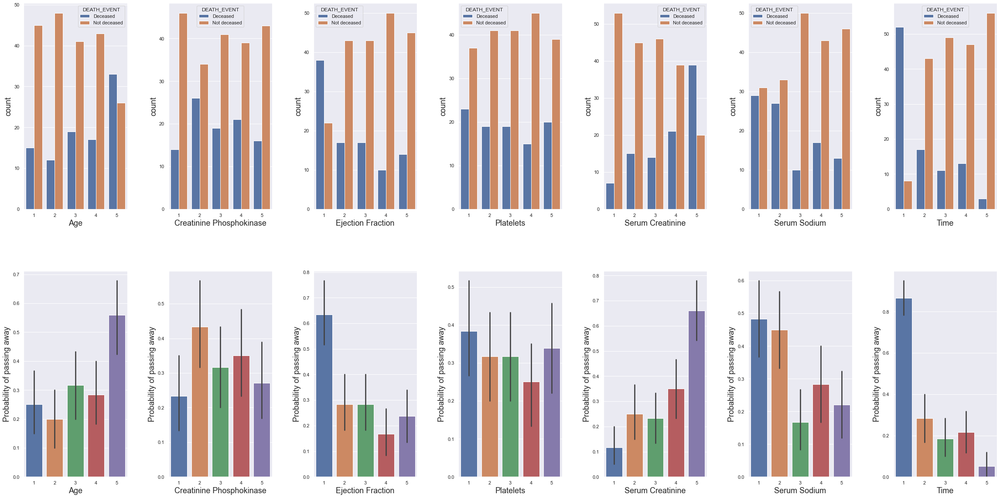

In [55]:
# visualized the smoothed data
f,axes=plt.subplots(2,7,figsize=(40,20))
f.subplots_adjust(hspace=0.3)
f.subplots_adjust(wspace=0.4)


df_temp = df1.copy()
df_temp['DEATH_EVENT'] = df_temp['DEATH_EVENT'].apply(lambda x: "Deceased" if  x==1 else 'Not deceased')


i = 0
for f in continues_features:
    f = "bin_"+f
    sns.countplot(x=f, hue="DEATH_EVENT", data=df_temp,ax =axes[0,i])
    axes[0,i].set_xlabel(continues_titles[i],fontsize=18) 
    axes[0,i].set_ylabel("count",fontsize=18) 
    sns.barplot(x=f, y="DEATH_EVENT", data=df1,ax =axes[1,i])
    axes[1,i].set_ylabel("Probability of passing away",fontsize=18)
    axes[1,i].set_xlabel(continues_titles[i],fontsize=18) 
    i+=1

### Dimensionality Reduction:

From observing the plots there seems to be a clear relationship between time and the outcome, however this feature is misleading because the time feature is simply a measure of the follow-up time in days for each patient. Desicions should not be dependent on this attribute, but on attributes that present medical resoning only. Therefore I will drop the time attribute.

Additionaly I will perform a dimension reduction using decision trees by finding the least significant mean of feature importance applied 20 times using both gini index and information gain decision trees.
 

In [56]:
# drop time and binned time columns
df1 = df1.drop(columns =['time','bin_time'])

In [57]:
# drop non-binned columns from the data
continues_features.remove("time")
x = df1.drop(columns = continues_features)

In [58]:
df2 = pd.DataFrame()
for c in x.columns:
    name = c.replace('bin','')
    name = name.replace('_',' ')
    df2[name] = x[c]
df2 = df2.drop(columns=['index'])

In [59]:
# separate train and test for dimension reduction to avoid overfitting.
X = df2.drop(columns = ['DEATH EVENT'])
y = df2["DEATH EVENT"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

# decision tree for dimension reduction (gini and info gain- entropy)
tree_gini = DecisionTreeClassifier(criterion='gini',random_state=12).fit(X_train,y_train)
tree_entropy = DecisionTreeClassifier(criterion='entropy',random_state=20).fit(X_train,y_train)


In [60]:
# get mean of feature score
sum_=0
for i in range(10):
    sum_ += tree_gini.feature_importances_
    sum_ += tree_entropy.feature_importances_
mean_feature_importance=sum_/20
print(X_train.columns)
print(mean_feature_importance)

Index(['anaemia', 'diabetes', 'high blood pressure', 'sex', 'smoking', ' age',
       ' creatinine phosphokinase', ' ejection fraction', ' platelets',
       ' serum creatinine', ' serum sodium'],
      dtype='object')
[0.02486313 0.03838635 0.04290375 0.02048039 0.08161252 0.10971021
 0.13159241 0.11916897 0.16253626 0.19991727 0.06882876]


In [61]:
# Update test and train data based on the mean_feature_importance array for dimension reduction (drop weakest features)

X_train = X_train.drop(columns = [X_train.columns[0],X_train.columns[2],X_train.columns[3]])
X_test = X_test.drop(columns = [X_test.columns[0],X_test.columns[2],X_test.columns[3]])


### Modeling:

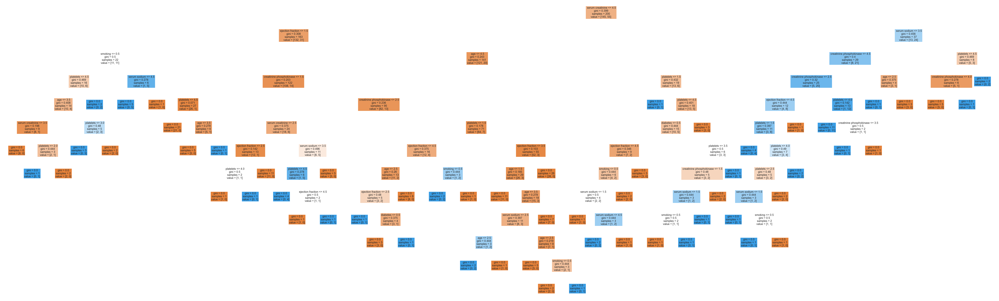

In [62]:

plt.figure(figsize=(130,40))

# create a decision tree using gini index
tree_gini = DecisionTreeClassifier(criterion='gini',random_state=12).fit(X_train,y_train)


#plot the tree
tree.plot_tree(tree_gini,filled = True,fontsize = 20,feature_names = X_train.columns) 

plt.show()

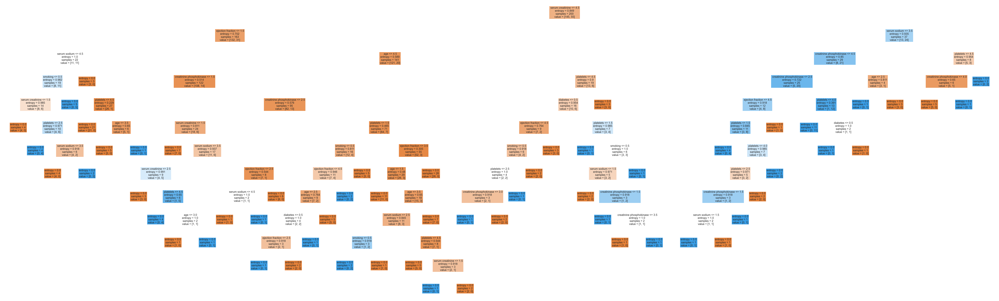

In [63]:

plt.figure(figsize=(130,40))

# create a desicion tree using information gain
tree_entropy = DecisionTreeClassifier(criterion='entropy',random_state=20).fit(X_train,y_train)

#plot the tree
tree.plot_tree(tree_entropy,filled = True,fontsize = 20,feature_names = X_train.columns) 

plt.show()

### Model Evaluation:

In [64]:
prediction_gini =  tree_gini.predict(X_test)
prediction_entropy = tree_entropy.predict(X_test)
cm_gini=confusion_matrix(y_test, prediction_gini)
cm_entropy=confusion_matrix(y_test, prediction_entropy)


In [65]:
gini_TP = cm_gini[0,0]
gini_TN =cm_gini[1,1]
gini_FP =cm_gini[1,0]
gini_FN =cm_gini[0,1]
gini_P = gini_TP+gini_FN
gini_N = gini_FP+gini_TN

entropy_TP = cm_entropy[0,0]
entropy_TN = cm_entropy[1,1]
entropy_FP =cm_entropy[1,0]
entropy_FN = cm_entropy[0,1]
entropy_P = entropy_TP+entropy_FN
entropy_N = entropy_FP+entropy_TN

#### Confusion Matrix:

In [66]:
confusion_matrix_gini=pd.DataFrame()
confusion_matrix_gini['yes']=[gini_TP,gini_FP,gini_TP+gini_FP]
confusion_matrix_gini['no']=[gini_FN,gini_TN,gini_TN+gini_FN]
confusion_matrix_gini['Total']=[gini_P,gini_N,gini_P+gini_N]

confusion_matrix_gini.to_excel("matrix_gini.xlsx",sheet_name = "matrix_gini")
confusion_matrix_gini

,yes,no,Total
0,43,15,58
1,17,24,41
2,60,39,99


In [67]:
confusion_matrix_entropy=pd.DataFrame()
confusion_matrix_entropy['yes']=[entropy_TP,entropy_FP,entropy_TP+entropy_FP]
confusion_matrix_entropy['no']=[entropy_FN,entropy_TN,entropy_TN+entropy_FN]
confusion_matrix_entropy['Total']=[entropy_P,entropy_N,entropy_P+entropy_N]

confusion_matrix_entropy.to_excel("matrix_entropy.xlsx",sheet_name = "matrix_enropy")
confusion_matrix_entropy

,yes,no,Total
0,43,15,58
1,19,22,41
2,62,37,99


#### Accuracy Measures:

Find the accuracy, error rate, sensitivity, specificity, precision and F-score of both models.

In [68]:
metrics = pd.DataFrame()
measures = ['Accuracy','Error Rate','Sensitivity','Specifity','Precision','F-Score']
metrics["Measure"]=measures

#prepare gini stats
gini_stats=[]

accuracy = (gini_TP+gini_TN)/(gini_P+gini_N)
gini_stats.append(accuracy)

error_rate = (gini_FP+gini_FN)/(gini_P+gini_N)
gini_stats.append(error_rate)

sensitivity = (gini_TP)/(gini_P)
gini_stats.append(sensitivity)

specificity=(gini_TN)/(gini_N)
gini_stats.append((gini_TN)/(gini_N))

precision=(gini_TP)/(gini_TP+gini_FP)
gini_stats.append(precision)

f_score = f1_score(y_test, prediction_gini)
gini_stats.append(precision)

metrics['GINI Index'] = gini_stats

entropy_stats=[]

accuracy = (entropy_TP+entropy_TN)/(entropy_P+entropy_N)
entropy_stats.append(accuracy)

error_rate = (entropy_FP+entropy_FN)/(entropy_P+entropy_N)
entropy_stats.append(error_rate)

sensitivity = (entropy_TP)/(entropy_P)
entropy_stats.append(sensitivity)

specificity=(entropy_TN)/(entropy_N)
entropy_stats.append((entropy_TN)/(entropy_N))

precision=(entropy_TP)/(entropy_TP+entropy_FP)
entropy_stats.append(precision)

f_score = f1_score(y_test, prediction_entropy)
entropy_stats.append(precision)

metrics['Information Gain'] = entropy_stats
metrics.to_excel('metrics.xlsx',sheet_name = 'metrics')
metrics

,Measure,GINI Index,Information Gain
0,Accuracy,0.676768,0.656566
1,Error Rate,0.323232,0.343434
2,Sensitivity,0.741379,0.741379
3,Specifity,0.585366,0.536585
4,Precision,0.716667,0.693548
5,F-Score,0.716667,0.693548


In [69]:
metrics.to_excel('metrics.xlsx',sheet_name = 'metrics')

#### Cross-Validation:

In [70]:
scores_gini = cross_val_score(tree_gini, X, y, cv=10)
scores_entropy = cross_val_score(tree_entropy, X, y, cv=10)
cv = pd.DataFrame()
cv["metric"] = ['mean','standard deviation']
cv['GINI index'] = [scores_gini.mean(),scores_gini.std()]
cv['Information Gain'] = [scores_entropy.mean(),scores_entropy.std()]
cv.to_excel('cv.xlsx',sheet_name = 'cv')
cv

,metric,GINI index,Information Gain
0,mean,0.662529,0.635517
1,standard deviation,0.086574,0.071792


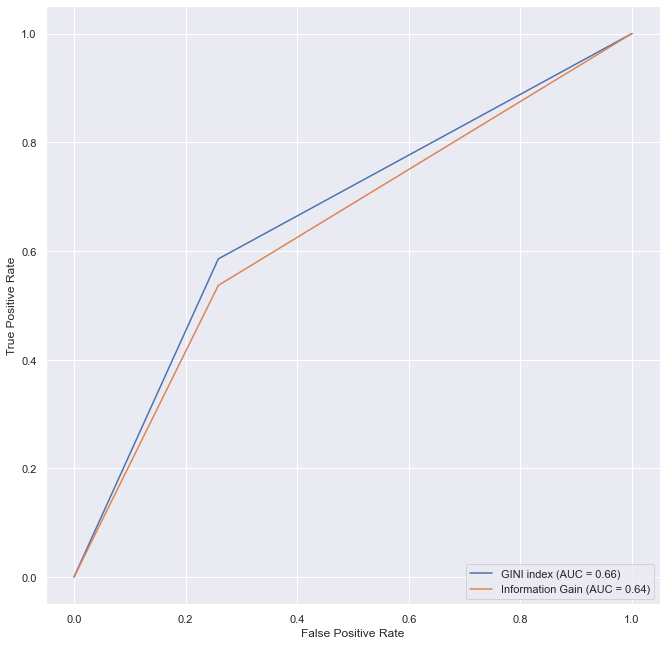

In [71]:
fig, ax_roc= plt.subplots( figsize=(11, 11))



skl.metrics.plot_roc_curve(tree_gini, X_test, y_test, ax=ax_roc,name="GINI index")
skl.metrics.plot_roc_curve(tree_entropy, X_test, y_test, ax=ax_roc, name = "Information Gain")

### Conclusion:

The result of this project is reflected in the ROC curve, cross-validation and the accuracy measure. The GINI index returns the best results although the Information Gain results are only shy around 0.02 points. My conclusion is that for this dataset the 2 models perform quite the same with no obvious differences however other classification models may perform better but that is beyond the scope of this project.

## Cluster Analysis

In this section we are looking to find if the data can be separated into clusters. The reason I am presenting such an analysis is to see whether the data holds certain patterns with regards to its features.

For this section we will run K-Means and DBSCAN algorithms for a cluster analysis.
K - Means is considered a partitioning method which organizes the data based on euclidean distance of K main centroids.
DBSCAN on the other hand is a density based algorithm and is important because this algorithm is designed to define clusters with unique shapes such as S or O. Algorithms like K-Means have a difficulty finding such sophisticated clusters which is why DBSCAN is very useful.

In [72]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from itertools import combinations
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.cm as cm
from sklearn import metrics
from sklearn.metrics import pairwise_distances
from sklearn.cluster import DBSCAN


Drop the time column and the response; the death event column.

In [73]:

X=df.drop(columns = ["DEATH_EVENT","time"])

### K Means

Some of the challenges of this algorithm is finding the ideal number of clusters, therefore we will perform a grid analysis based on integers ranging from 2 to 15 that reperesent the number of clusters.
One of the methods used to determine the number of clusters is Silhouette Coefficient.


If the ground truth labels are not known, evaluation must be performed using the model itself. The Silhouette Coefficient (sklearn.metrics.silhouette_score) is an example of such an evaluation, where a higher Silhouette Coefficient score relates to a model with better defined clusters. The Silhouette Coefficient is defined for each sample and is composed of two scores:

a: The mean distance between a sample and all other points in the same class.

b: The mean distance between a sample and all other points in the next nearest cluster.

The Silhouette Coefficient s for a single sample is then given as: 

$s=\frac{b-a}{max(a,b)}$


 
The Silhouette Coefficient for a set of samples is given as the mean of the Silhouette Coefficient for each sample.

In [74]:
# grid search the different clutsers

silhouette_scores = []

cluster_grid = np.arange(2,16)
for num in cluster_grid:
    kmeans = KMeans(n_clusters=num, random_state=0).fit(X)
    silhouette_score = metrics.silhouette_score(X, kmeans.labels_, metric='euclidean')
    silhouette_scores.append(silhouette_score)



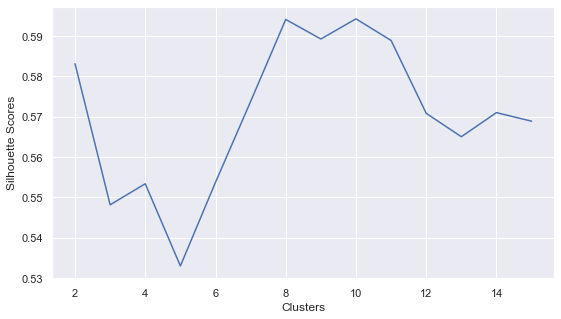

In [75]:
#visualize the results


# convert to pandas dataframe
x1 = {'Clusters': cluster_grid, 'Silhouette Scores': silhouette_scores}
data_score1 = pd.DataFrame(x1)



# plot using lineplot
fig,ax = plt.subplots(figsize=(9,5))

sns.lineplot(x="Clusters", y='Silhouette Scores', data=data_score1)


Cluster num 8 and 10 score the best results with a grade of 0.59. For the sake of a better result interpretability and simplicity we will continue with 8, then  present the results from runnning the algorithm and its visualization.

In [76]:
best_cluster_num = 8
kmeans8 = KMeans(n_clusters=best_cluster_num, random_state=0).fit(X)

cluster_data = X
cluster_data["cluster"] = kmeans8.labels_



agg_cluster_data = cluster_data.groupby(by=["cluster"]).agg(["mean","std"]).round(2)
agg_cluster_data["count"] = cluster_data["cluster"].value_counts().sort_index()
agg_cluster_data=agg_cluster_data.reset_index().set_index(['cluster', "count"])

agg_cluster_data

age        anaemia       creatinine_phosphokinase           \
                mean    std    mean   std                     mean      std   
cluster count                                                                 
0       9      63.44  10.68    0.44  0.53                   875.22   781.11   
1       88     61.34  11.45    0.32  0.47                   718.24  1152.22   
2       12     67.17  13.78    0.42  0.51                   328.83   210.79   
3       75     61.31  12.95    0.48  0.50                   455.57   845.96   
4       2      45.00   0.00    0.00  0.00                  1176.00  1250.16   
5       31     58.90  13.88    0.48  0.51                   616.29  1425.81   
6       44     59.48   9.74    0.48  0.51                   603.39   778.05   
7       38     60.11  10.63    0.53  0.51                   441.26   575.46   

              diabetes       ejection_fraction         ...  platelets  \
                  mean   std              mean    std  ...       mean   
cluster count                                          ...              
0       9         0.44  0.53             39.22  10.45  ...   66111.11   
1       88        0.42  0.50             38.25  12.42  ...  263488.64   
2       12        0.58  0.51             40.50  12.81  ...  495916.67   
3       75        0.41  0.50             37.80  10.86  ...  215106.67   
4       2         1.00  0.00             47.50  17.68  ...  796000.00   
5       31        0.35  0.49             38.84  11.00  ...  379935.48   
6       44        0.48  0.51             38.43  11.81  ...  312659.09   
7       38        0.32  0.47             35.71  13.22  ...  151105.26   

                        serum_creatinine       serum_sodium         sex        \
                    std             mean   std         mean   std  mean   std   
cluster count                                                                   
0       9      23427.79             1.52  0.70       134.22  6.48  0.67  0.50   
1       88     11006.78             1.34  0.88       135.97  4.63  0.67  0.47   
2       12     51307.38             1.44  0.69       136.00  2.83  0.58  0.51   
3       75     15516.84             1.39  0.87       136.57  3.73  0.64  0.48   
4       2      76367.53             1.05  0.35       140.00  2.83  0.50  0.71   
5       31     22042.29             1.50  1.63       137.97  3.35  0.58  0.50   
6       44     14373.66             1.24  0.51       136.80  5.22  0.57  0.50   
7       38     17523.40             1.59  1.58       137.55  4.52  0.79  0.41   

              smoking        
                 mean   std  
cluster count                
0       9        0.22  0.44  
1       88       0.33  0.47  
2       12       0.42  0.51  
3       75       0.27  0.45  
4       2        0.50  0.71  
5       31       0.29  0.46  
6       44       0.34  0.48  
7       38       0.39  0.50  

[8 rows x 22 columns]

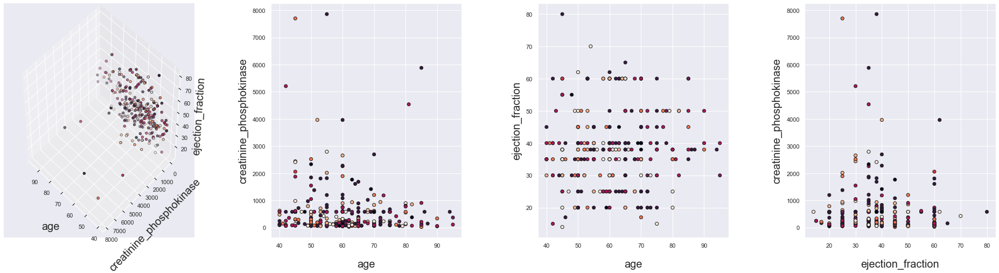

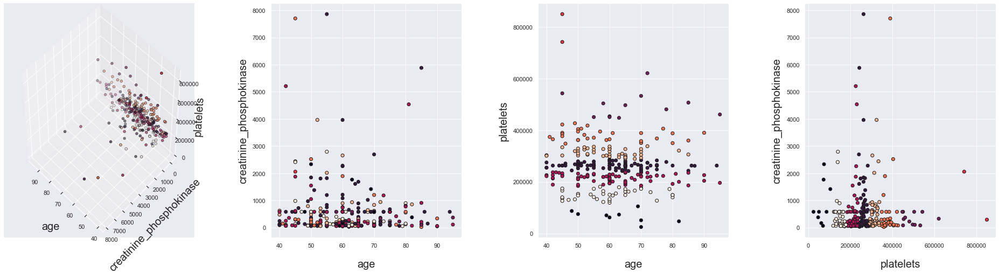

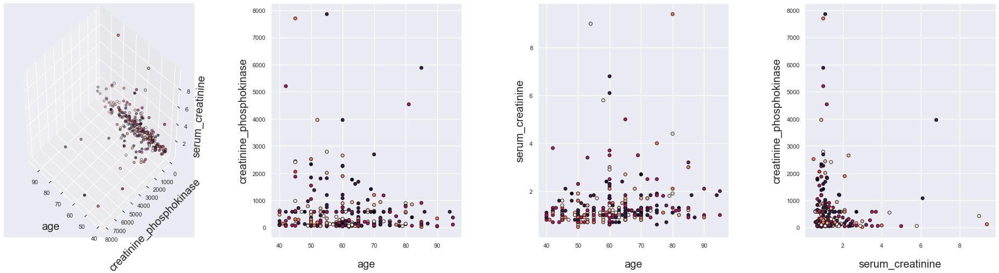

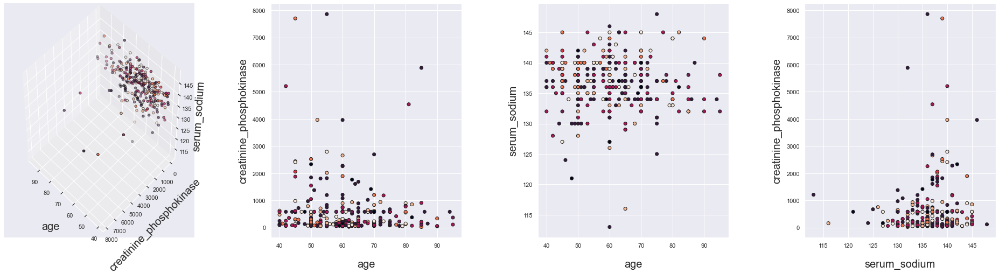

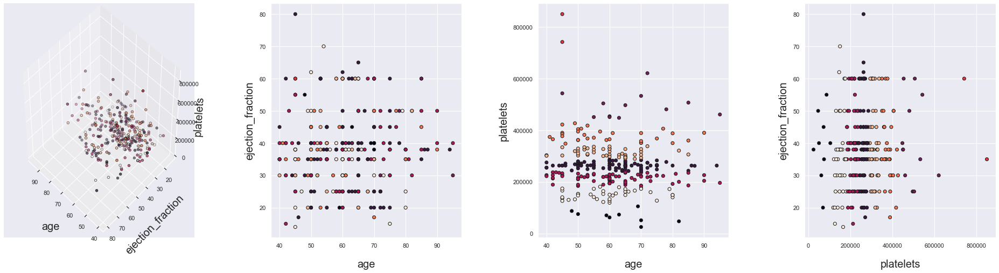

...

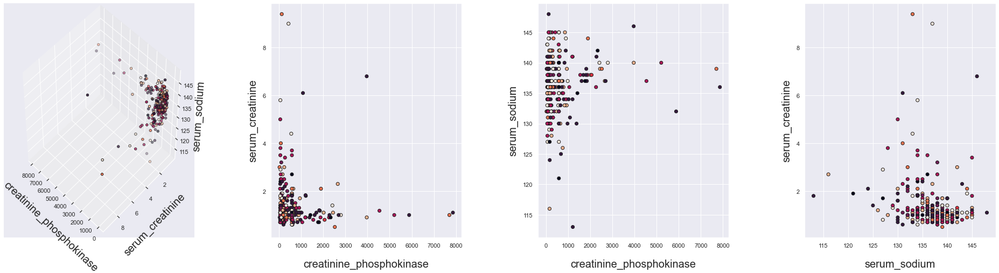

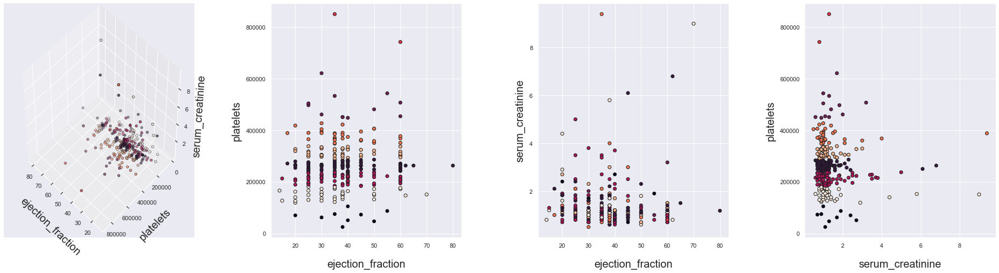

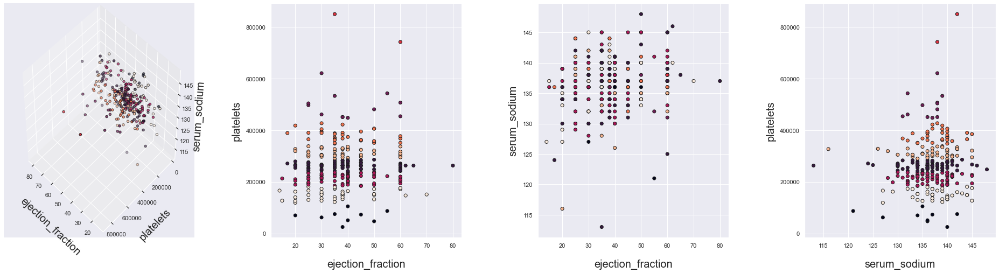

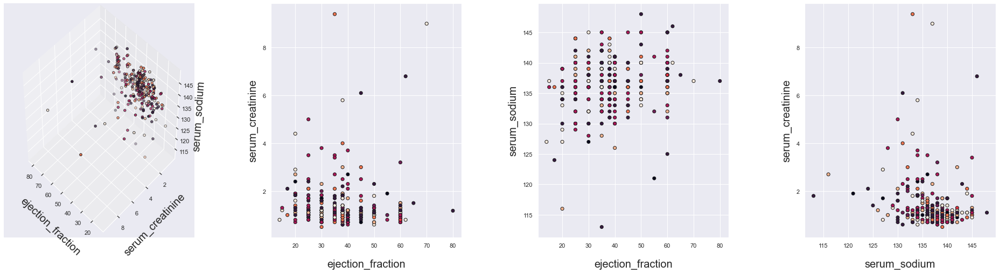

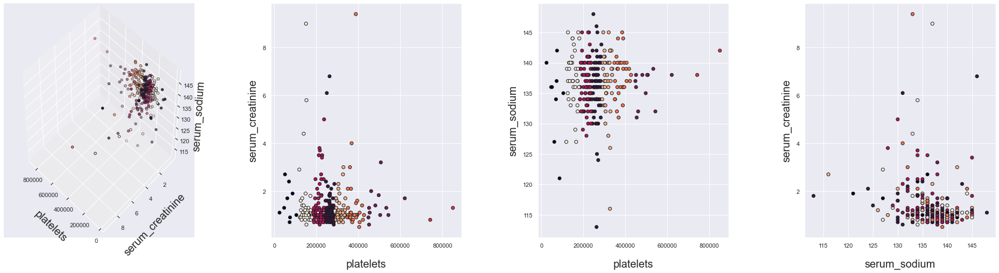

In [77]:
# vizualisation
def viz (method,x,columns):

    fignum = 1
    chosen_columns = columns
    comb = combinations(chosen_columns,3) 
    
    count_comb=0


    
    labels = method.labels_
    for i in comb:
        fig = plt.figure(figsize=(33,8))
        gs = fig.add_gridspec(1, 4)
        fig.subplots_adjust(wspace=0.4)
        
        ax1 = fig.add_subplot(gs[0], projection='3d')
        ax1.scatter(x[i[0]], x[i[1]], x[i[2]],c=labels.astype(float), edgecolor='k') 
        ax1.set_xlabel(i[0],labelpad=20,size= 20)
        ax1.set_ylabel(i[1],labelpad=20,size= 20)
        ax1.set_zlabel(i[2],labelpad=8,size= 20)
        ax1.view_init(48, 134)        
        
        

        ax2 = fig.add_subplot(gs[1])
        ax2.scatter(x[i[0]], x[i[1]], c=labels.astype(float), edgecolor='k')
        ax2.set_xlabel(i[0],labelpad=20,size= 20)
        ax2.set_ylabel(i[1],labelpad=8,size= 20)

        
        ax3 = fig.add_subplot(gs[2])
        ax3.scatter(x[i[0]], x[i[2]], c=labels.astype(float), edgecolor='k') 
        ax3.set_xlabel(i[0],labelpad=20,size= 20)
        ax3.set_ylabel(i[2],labelpad=8,size= 20)
        
        ax4 = fig.add_subplot(gs[3])
        ax4.scatter(x[i[2]], x[i[1]], c=labels.astype(float), edgecolor='k')  
        ax4.set_xlabel(i[2],labelpad=20,size= 20)
        ax4.set_ylabel(i[1],labelpad=8,size= 20)
        
        


columns = ["age","creatinine_phosphokinase","ejection_fraction","platelets","serum_creatinine","serum_sodium"]
viz(kmeans8,X,columns) 

### DBSCAN

Looking at the plots of K-Means visualization there seems to be a 'single cluster' in the hyperplance for all the objects in the data set, we can assume the DBSCAN will lack performance since its sole purpouse is to find patterns within data density.

Similar to our K-Means analysis; we will perform a search for the best performing model in order to get the best EPS and minimum samples. Quick reminder, EPS is the maximum epsilon used for finding neighbors between points in the algoritm and minimum samples are used for the minimum number of objects in a cluser, for example if object X has has 2 neibhors only he can reach given a certain 

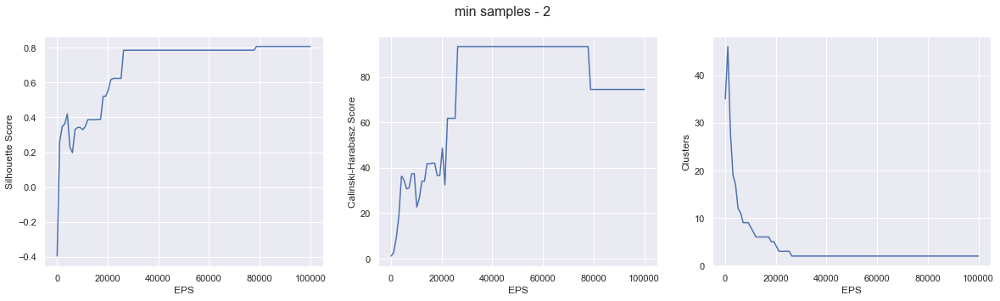

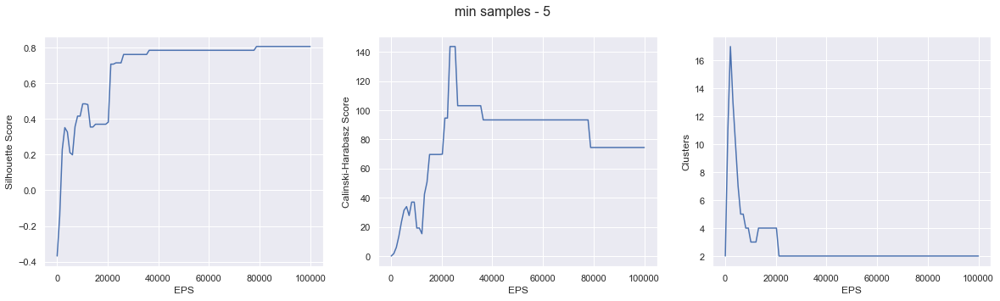

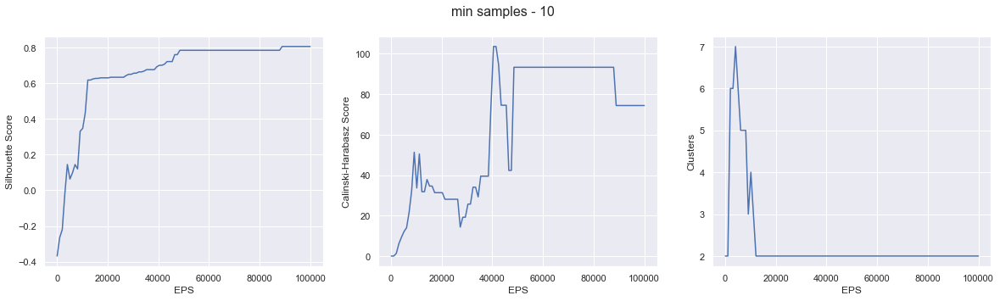

In [78]:
from sklearn.preprocessing import StandardScaler


eps = np.linspace(100, 100000, num=100)
for samples in [2,5,10]:
    silhouette_scores = []
    calinski_Harabasz_scores=[]
    clusters = []
    for num in eps:
        dbscan = DBSCAN(eps=num, min_samples=samples).fit(X)

        labels_= dbscan.labels_

    
        #print(metrics.silhouette_score(df, labels_))
        silhouette_scores.append(metrics.silhouette_score(X, labels_))
        calinski_Harabasz_scores.append(metrics.calinski_harabasz_score(X, labels_))
        clusters.append(len(np.unique(labels_)))

    
    # convert to pandas dataframe
    x1 = {'EPS': eps, 'Silhouette Score': silhouette_scores}
    data_score1 = pd.DataFrame(x1)
    
    x2 = {'EPS': eps, 'Calinski-Harabasz Score': calinski_Harabasz_scores}
    data_score2 = pd.DataFrame(x2)

    y = {'EPS': eps, 'Clusters': clusters}
    data_clusters = pd.DataFrame(y)
    



    # plot using lineplot
    sns.set(style='darkgrid')
    fig,ax = plt.subplots(1, 3,figsize=(20,5))
    fig.suptitle('min samples - '+str(samples), fontsize=16)
    sns.lineplot(x='EPS', y='Silhouette Score', data=data_score1,ax=ax[0])


    sns.lineplot(x='EPS', y='Calinski-Harabasz Score', data=data_score2,ax=ax[1])
    sns.lineplot(x='EPS', y='Clusters', data=data_clusters,ax=ax[2])


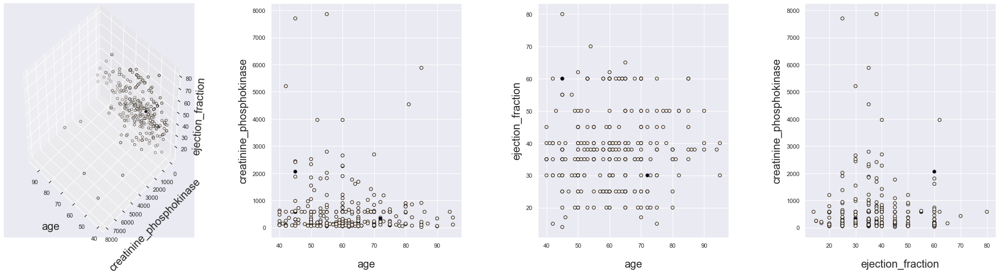

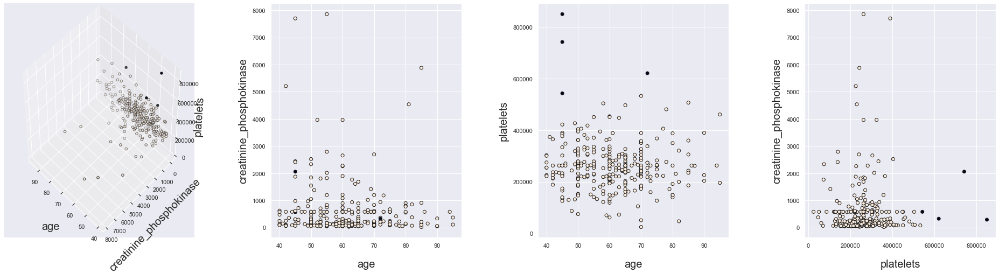

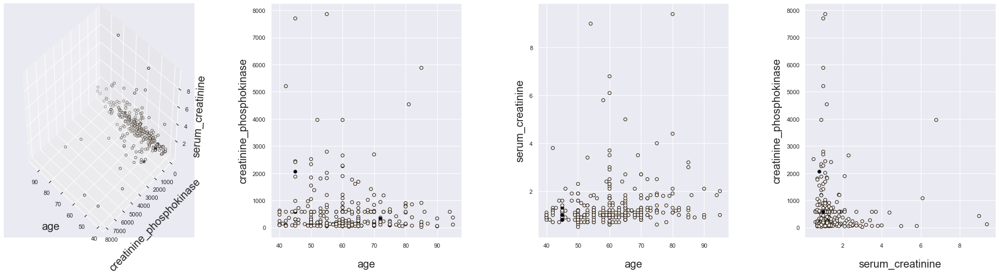

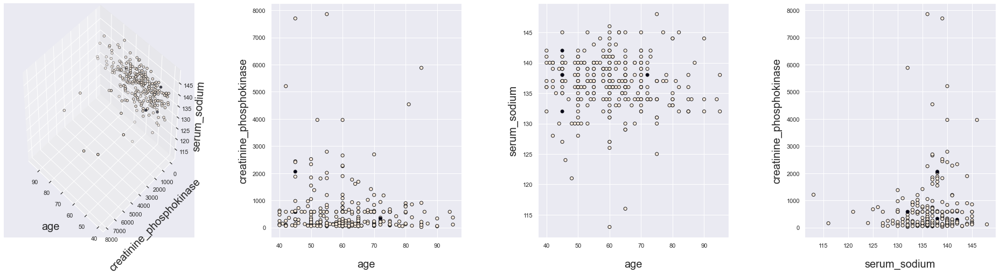

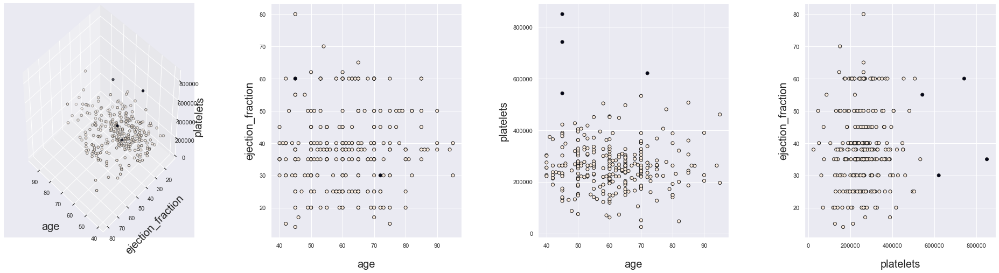

...

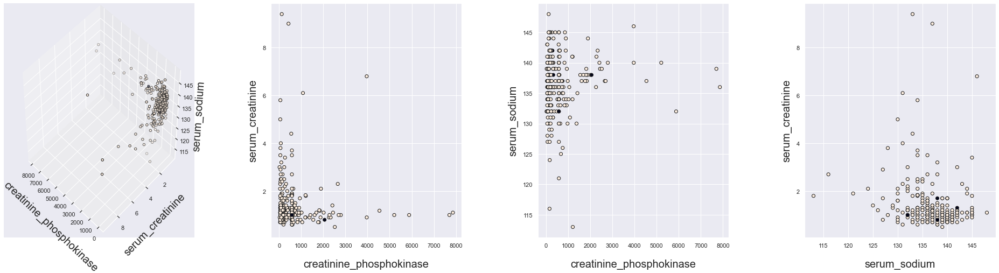

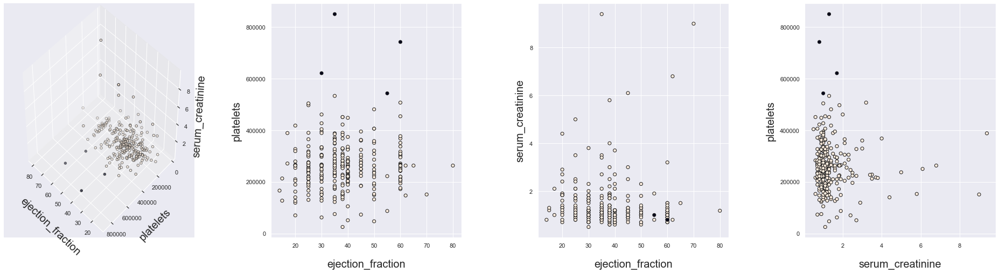

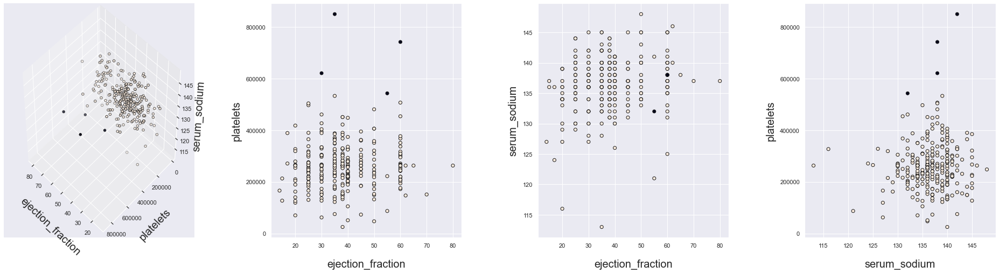

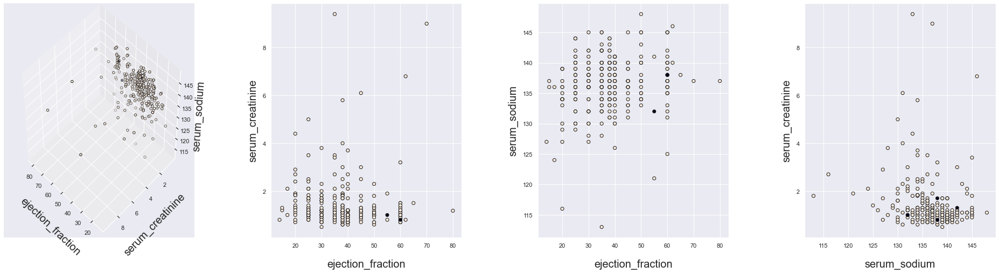

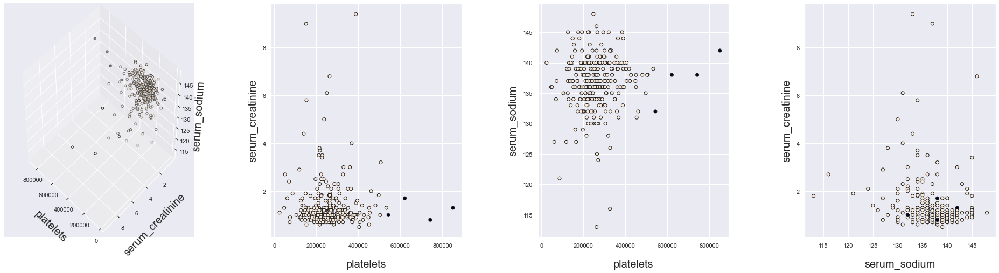

In [79]:
dbscan = DBSCAN(eps=27000, min_samples=5).fit(X)
viz(dbscan,X,columns)

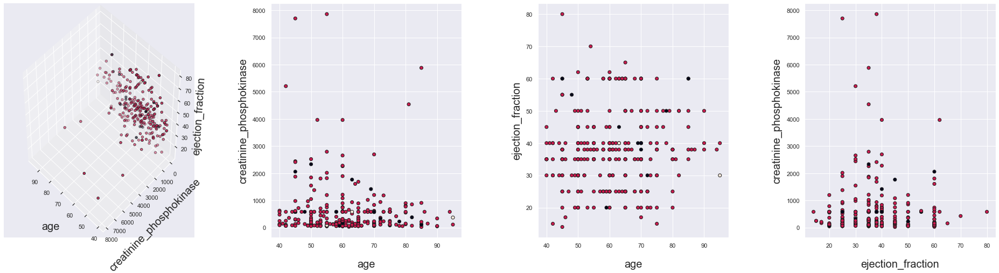

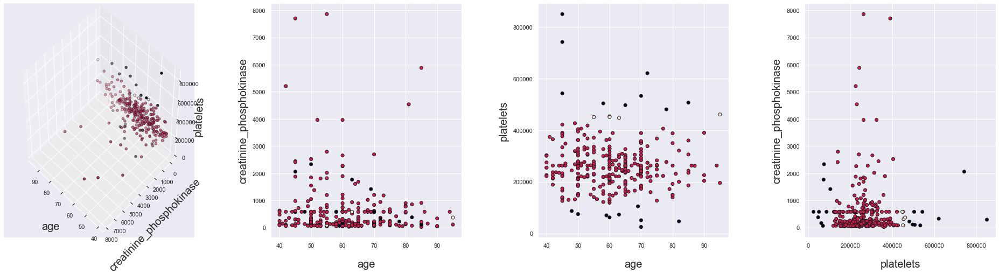

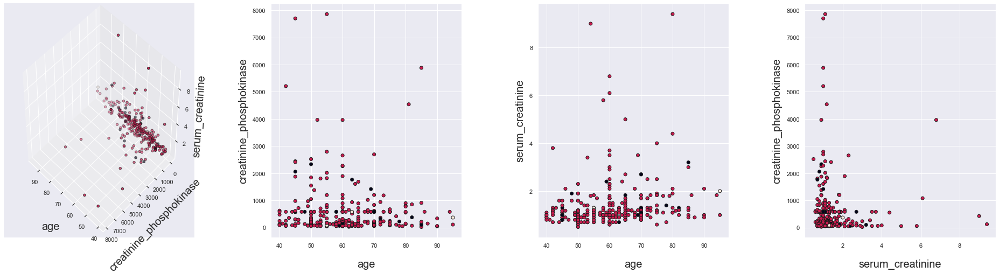

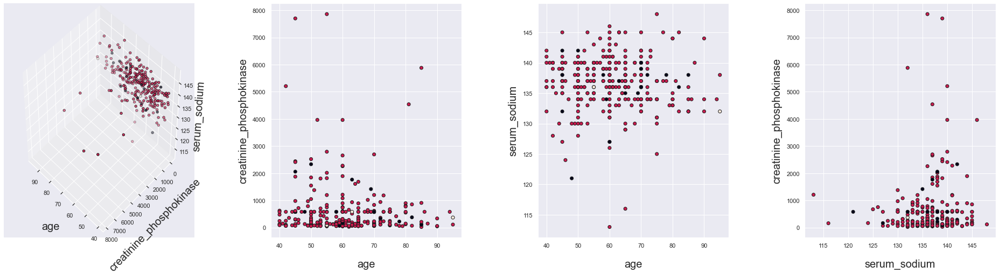

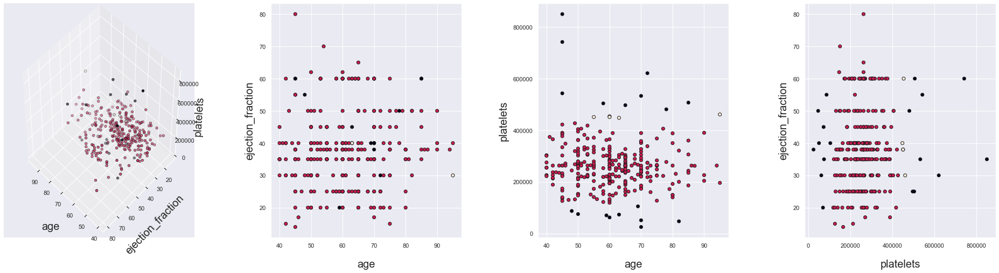

...

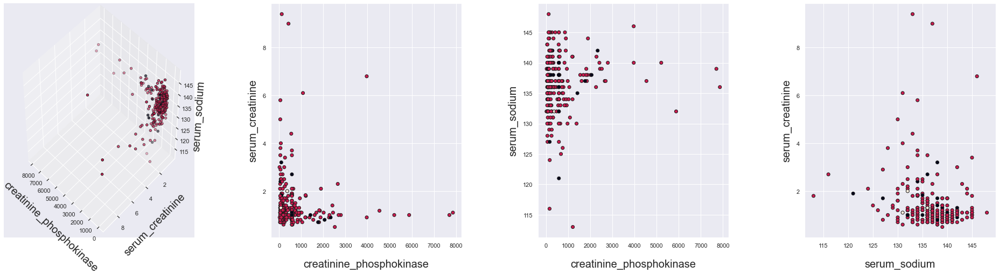

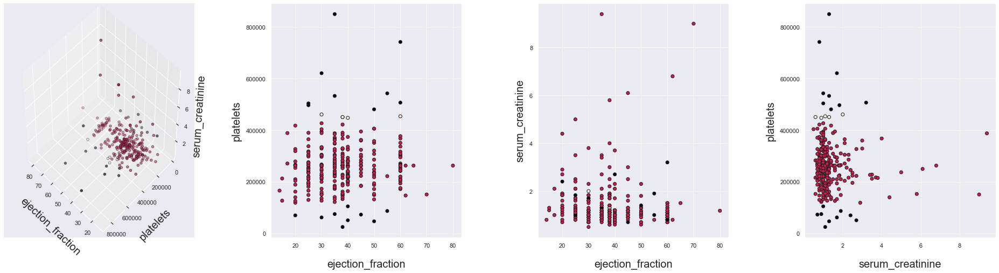

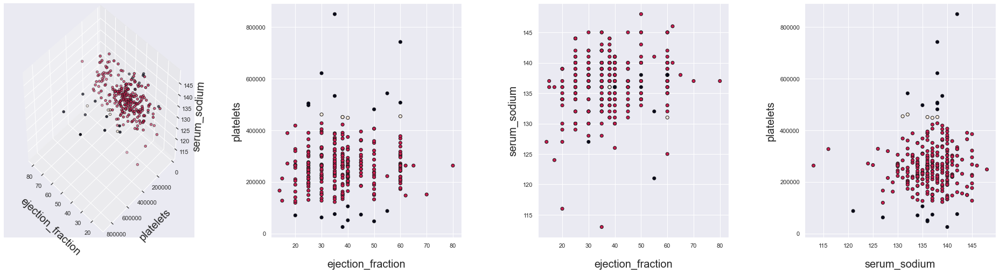

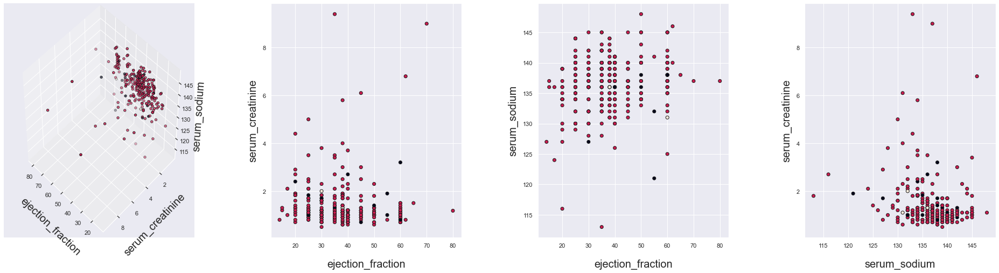

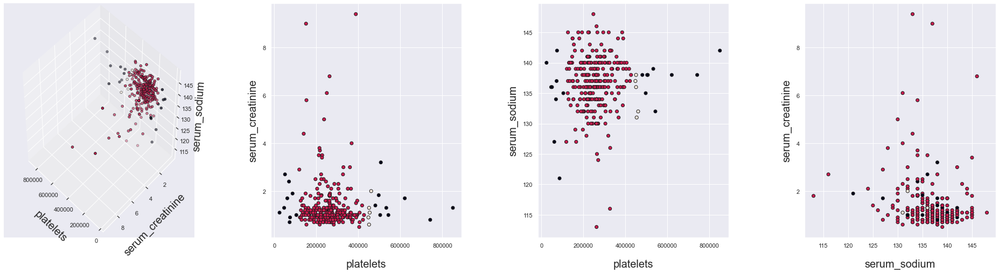

In [80]:
dbscan = DBSCAN(eps=13000, min_samples=5).fit(X)
viz(dbscan,X,columns)

## Conclusion:

Looking at the results of the plots it is difficult to draw inference from the given models. Unfortunately most objects are all clustered together based on the euclidean distance. Perhaps a different clustering would be better e.g. hierarchical clustering but not promised.
Looking back at the tree plot it is clear that serum creatinine, ejection fraction and age are the 3 major attributes with the strongest impact on patient survivablity, all have a good degree of separation with a sufficient sample size.


Some limitations are presents in this project, with the first one being the amount of the data. More data means more accurate and reliable results. Other limitations:

* Lacking basic data such as height and weight. Height and weight data are relevant for calculating the BMI index which may act as a useful predictor.

* The data follows pateients from a single region, the validation process could be better given data from other regions.

* Another missing and useful predictor is family history, it is commonly known that heart diseas tendecies are backed by genetic history.